# <font style="color:blue">Project 3: Object Detection</font>


#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Plot Ground Truth Bounding Boxes</h3></td> <td><h3>20</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Training</h3></td> <td><h3>25</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Inference</h3></td> <td><h3>15</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>COCO Detection Evaluation</h3></td> <td><h3>25</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>Run Inference on a Video</h3></td> <td><h3>15</h3></td> </tr>
    </table>
</div>


# <font style="color:purple">Download the Dataset</font>

**[Download the Vehicle registration plate](https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1)**


Download the Vehicle Registration Plate dataset from [here](https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1) and unzip it.

We will have the following directory structure:

```
Dataset
├── train
│   └── Vehicle registration plate
│       └── Label
└── validation
    └── Vehicle registration plate
        └── Label
```

Unzipping the file will give you a directory `Dataset`. This directory has two folder `train` and `validation`. Each train and validation folder has `Vehicle registration plate`  folder with `.jpg` images and a folder `Labels`.  `Labels` folder has bounding box data for the images.


For example,
For image: `Dataset/train/Vehicle registration plate/bf4689922cdfd532.jpg`
Label file is  `Dataset/train/Vehicle registration plate/Label/bf4689922cdfd532.txt`

There are one or more lines in each `.txt` file. Each line represents one bounding box.
For example,
```
Vehicle registration plate 385.28 445.15 618.24 514.225
Vehicle registration plate 839.68 266.066462 874.24 289.091462
```

We have a single class detection (`Vehicle registration plate detection`) problem. So bounding box details start from the fourth column in each row.

Representation is in `xmin`, `ymin`, `xmax`, and `ymax` format.

**It has `5308` training and `386` validation dataset.**

Data is downloaded from [Open Images Dataset](https://storage.googleapis.com/openimages/web/index.html)

#  <font style="color:green">1. Plot Ground Truth Bounding Boxes [20 Points]</font>

**You have to show three images from validation data with the bounding boxes.**

The plotted images should be similar to the following:

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g1.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g2.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g3.png'>



In [1]:
%matplotlib inline

##  <font style="color:green">1.1. Import</font>

In [2]:
import subprocess
import sys

# Run pip install command from within Python
subprocess.check_call([
    sys.executable, "-m", "pip", "install",
    "git+https://github.com/facebookresearch/detectron2.git"
])

subprocess.check_call([
    sys.executable, "-m", "pip", "install",
    "wget"
])

0

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
import os
import wget
import zipfile
import matplotlib.pyplot as plt
import time

# model_zoo has lots of pre-trained models
from detectron2 import model_zoo

# DefaultTrainer is a class for training object detector
from detectron2.engine import DefaultTrainer
# DefaultPredictor is class for inference
from detectron2.engine import DefaultPredictor

# detectron2 has its configuration format
from detectron2.config import get_cfg
# detectron2 has implemented Visualizer of object detection
from detectron2.utils.visualizer import Visualizer

# from DatasetCatalog, detectron2 gets dataset and from MetadatCatalog it gets metadata of the dataset
from detectron2.data import DatasetCatalog, MetadataCatalog

# BoxMode supports bounding boxes in different format
from detectron2.structures import BoxMode

# COCOEvaluator based on COCO evaluation metric, inference_on_dataset is used for evaluation for a given metric
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# build_detection_test_loader, used to create test loader for evaluation
from detectron2.data import build_detection_test_loader

##  <font style="color:green">Folder Clean up</font>

In [4]:
import shutil
import os

folder_path = "./data_root"

try:
    if os.path.exists(folder_path): # Check if the folder exists before attempting to delete
        shutil.rmtree(folder_path)
        print(f"Folder '{folder_path}' and its contents deleted successfully.")
    else:
        print(f"Folder '{folder_path}' does not exist.")
except OSError as e:
    print(f"Error deleting folder '{folder_path}': {e}")


Folder './data_root' and its contents deleted successfully.


In [5]:
from pathlib import Path

data_root = "./data_root"
data_zip_file = "Dataset.zip"
video_file = "projet3-input-video.mp4"
output_dir = os.path.join(data_root, "outputs")
video_path = os.path.join(data_root, video_file)
print(video_path)
# Create folder if it doesn't exist
Path(data_root).mkdir(parents=True, exist_ok=True)
Path(output_dir).mkdir(parents=True, exist_ok=True)

time.sleep(3) # Folder to get created

./data_root/projet3-input-video.mp4


In [6]:
import os
import requests

def download_file(url, target_folder, custom_filename):
  # Create folder if it doesn't exist
  os.makedirs(target_folder, exist_ok=True)
  file_path = os.path.join(target_folder, custom_filename)

  # Download with streaming
  response = requests.get(url, stream=True)
  response.raise_for_status()

  with open(file_path, 'wb') as f:
      for chunk in response.iter_content(chunk_size=8192):
          f.write(chunk)

  print(f"Downloaded to: {file_path}")

In [7]:
dataset_url = "https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1"
download_file(dataset_url, data_root, data_zip_file)

video_url = "https://www.dropbox.com/s/g88o4dx18zpgn8k/projet3-input-video.mp4?dl=1"
download_file(video_url, data_root, video_file)


#Unzip the file
data_zip_file_path = os.path.join(data_root, data_zip_file)

with zipfile.ZipFile(data_zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(data_root)

print(f"Unzipped to: {data_root}")


Downloaded to: ./data_root/Dataset.zip
Downloaded to: ./data_root/projet3-input-video.mp4
Unzipped to: ./data_root


##  <font style="color:green">1.2. Dataset in Detectron2 Format</font>

In [8]:
# write a function that loads the dataset into detectron2's standard format
def get_vehicle_registration_plate_dicts(data_root):
    dataset_dicts = []
    filenames = []

    # image_labels = os.listdir(data_root)
    image_file_names = os.listdir(data_root)
    image_file_names = image_file_names[:10]

    for idx, image_file_name in enumerate(image_file_names):

        if not (image_file_name.endswith(".jpg") or image_file_name.endswith(".png")):
            continue

        record = {}
        image_path = os.path.join(data_root, image_file_name)
        height, width = cv2.imread(image_path).shape[:2]

        record['file_name'] = image_path
        record['image_id'] = idx
        record['height'] = height
        record['width'] = width

        image_name = os.path.splitext(image_file_name)[0]
        annotation_path = os.path.join(data_root, 'Label', '{}.txt'.format(image_name))
        annotation_rows = []

        with open(annotation_path, "r") as f:
            for line in f:
                temp = line.rstrip().split(" ")
                annotation_rows.append(temp)

        objs = []
        for row in annotation_rows:
            xmin = float(row[3])
            ymin = float(row[4])
            xmax = float(row[5])
            ymax = float(row[6])

            obj= {
                'bbox': [xmin, ymin, xmax, ymax],
                'bbox_mode': BoxMode.XYXY_ABS,
                # alternatively, we can use bbox_mode = BoxMode.XYWH_ABS
                # 'bbox': [xmin, ymin, bwidth, bheight],
                # 'bbox_mode': BoxMode.XYWH_ABS,
                'category_id': 0, #int(row[0]),
                'iscrowd': 0
            }

            objs.append(obj)
        record['annotations'] = objs
        dataset_dicts.append(record)
    return dataset_dicts

##  <font style="color:green">1.3. Register Dataset</font>

In [9]:
# configurations

train_img_dir = os.path.join(data_root, 'Dataset', 'train', 'Vehicle registration plate')
val_img_dir = os.path.join(data_root, 'Dataset', 'validation', 'Vehicle registration plate')

train_data_name = 'vehicle_registration_plate_train'
test_data_name = 'vehicle_registration_plate_test'

thing_classes = ['Reg-plate']

# output_dir = os.path.join(data_root, '../', 'outputs')
# video_path = os.path.join(data_root, '../', 'projet3-input-video.mp4')

def count_lines(fname):
    with open(fname) as f:
        for i, l in enumerate(f):
            pass
    return i + 1

In [10]:
# Register train and test data
# dataset can be registered only once with one name


# register train data
DatasetCatalog.register(name=train_data_name,
                        func=lambda: get_vehicle_registration_plate_dicts(train_img_dir))
train_metadata = MetadataCatalog.get(train_data_name).set(thing_classes=thing_classes)



# register test data
DatasetCatalog.register(name=test_data_name,
                        func=lambda: get_vehicle_registration_plate_dicts(val_img_dir))
test_metadata = MetadataCatalog.get(test_data_name).set(thing_classes=thing_classes)

In [11]:
def count_images(folder):
    return len([
        f for f in os.listdir(folder)
        if f.endswith(".jpg") or f.endswith(".png")
    ])

train_img_count = count_images(train_img_dir)
val_img_count = count_images(val_img_dir)
print(f"Train images: {train_img_count}, Validation images: {val_img_count}")

Train images: 5308, Validation images: 386


##  <font style="color:green">1.4. Visualize the Data</font>

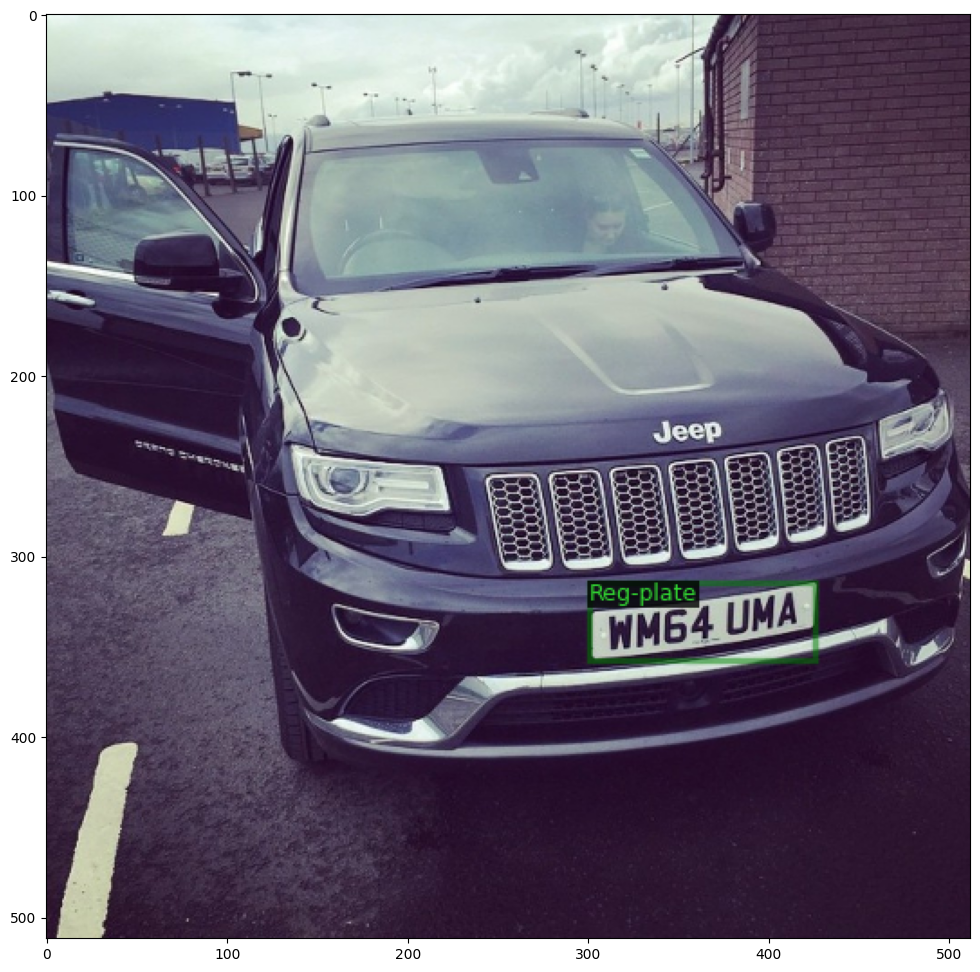

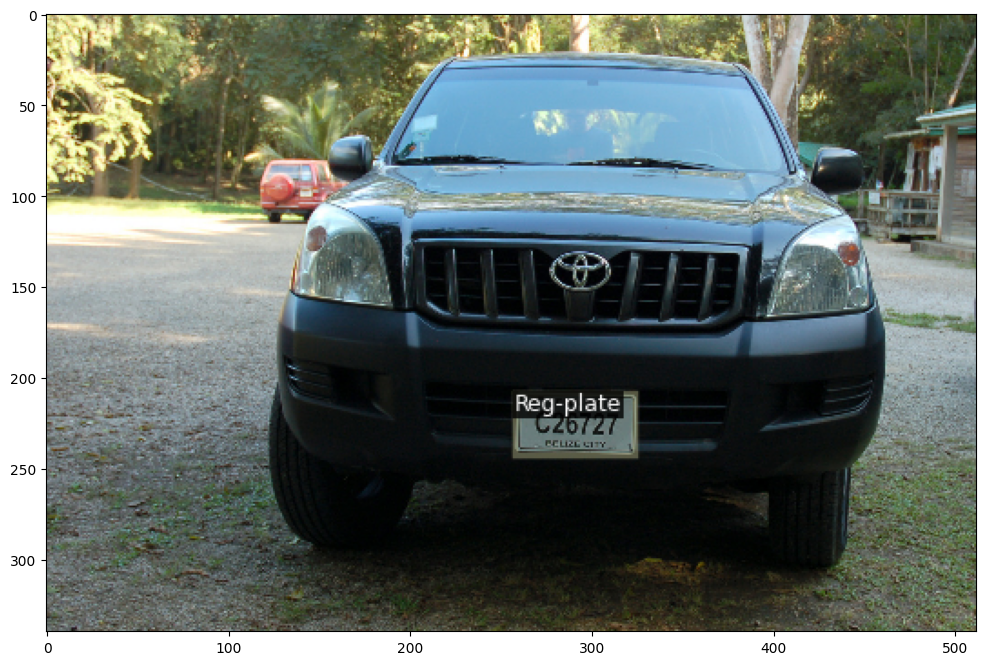

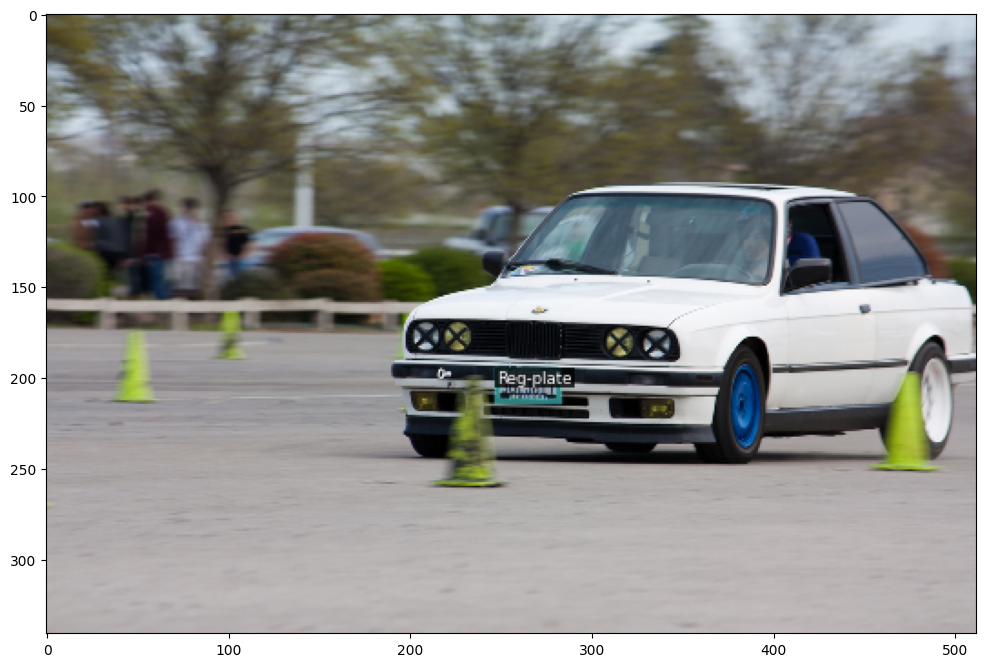

In [12]:
# lets visualize the data

test_data_dict = get_vehicle_registration_plate_dicts(val_img_dir)

for d in random.sample(test_data_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1],
                            metadata=test_metadata,
                            scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (12, 12))
    plt.imshow(vis.get_image())
    plt.show()

#  <font style="color:green">2. Training [25 Points]</font>

- **Write your training code in this section.**

- **You also have to share ([shared logs example](https://tensorboard.dev/experiment/JRtnsKbwTaq1ow6nPLPGeg)) the loss plot of your training using tensorboard.dev.**

How to share TensorBoard logs using tensorboard.dev find [here](https://courses.opencv.org/courses/course-v1:OpenCV+OpenCV-106+2019_T1/courseware/b1c43ffe765246658e537109e188addb/d62572ec8bd344db9aeae81235ede618/4?activate_block_id=block-v1%3AOpenCV%2BOpenCV-106%2B2019_T1%2Btype%40vertical%2Bblock%40398b46ddcd5c465fa52cb4d572ba3229).

##  <font style="color:green">2.1. Detectron2 Configuration</font>

Get default configuration of detectron2 and update parameters according to our requirements.

Get more details of the configuration [here](https://detectron2.readthedocs.io/modules/config.html#).

In [13]:
# detectron2 configuration

# default configuration
cfg = get_cfg()

# update configuration with RetinaNet configuration
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

# We have registered the train and test data set with name traffic_sign_train and traffic_sign_test.
# Let's replace the detectron2 default train dataset with our train dataset.
cfg.DATASETS.TRAIN = (train_data_name,)

# No metric implemented for the test dataset, we will have to update cfg.DATASET.TEST with empty tuple
cfg.DATASETS.TEST = ()


In [14]:
# data loader configuration
cfg.DATALOADER.NUM_WORKERS = 4

In [15]:
# Update model URL in detectron2 config file
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

In [16]:
# solver configuration

# batch size
cfg.SOLVER.IMS_PER_BATCH = 16

# choose a good learning rate
cfg.SOLVER.BASE_LR = 1e-4

# We need to specify the number of iteration for training in detectron2, not the number of epochs.
# lets convert number of epoch to number or iteration (max iteration)

epoch = 8
max_iter = int(epoch * train_img_count / cfg.SOLVER.IMS_PER_BATCH)
# max_iter = 1000

cfg.SOLVER.MAX_ITER = max_iter

In [17]:
# number of output class
# we have only one class that is Traffic Sign
cfg.MODEL.RETINANET.NUM_CLASSES = len(thing_classes)

In [18]:
# update create ouptput directory
cfg.OUTPUT_DIR = output_dir
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

##  <font style="color:purple">Set up TensorBoard</font>

Before starting the training, let's set up the TensorBoard.

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir outputs

<IPython.core.display.Javascript object>

In [20]:
# training

# Create a trainer instance with the configuration.
trainer = DefaultTrainer(cfg)

# if resume=False, because we don't have trained model yet. It will download model from model url and load it
trainer.resume_or_load(resume=False)

# start training
trainer.train()

[07/30 01:16:03 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[07/30 01:16:04 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/30 01:17:09 d2.utils.events]:  eta: 2:19:15  iter: 19  total_loss: 2.045  loss_cls: 1.495  loss_box_reg: 0.5351    time: 3.2354  last_time: 3.1435  data_time: 0.3960  last_data_time: 0.3013   lr: 1.9981e-06  max_mem: 10699M
[07/30 01:18:19 d2.utils.events]:  eta: 2:19:30  iter: 39  total_loss: 1.583  loss_cls: 1.195  loss_box_reg: 0.3793    time: 3.2496  last_time: 3.4210  data_time: 0.3764  last_data_time: 0.4755   lr: 3.9961e-06  max_mem: 10699M
[07/30 01:19:26 d2.utils.events]:  eta: 2:20:49  iter: 59  total_loss: 1.491  loss_cls: 1.122  loss_box_reg: 0.3474    time: 3.2736  last_time: 3.3187  data_time: 0.3670  last_data_time: 0.3321   lr: 5.9941e-06  max_mem: 10699M
[07/30 01:20:33 d2.utils.events]:  eta: 2:21:22  iter: 79  total_loss: 1.415  loss_cls: 1.121  loss_box_reg: 0.3008    time: 3.2945  last_time: 3.3645  data_time: 0.3642  last_data_time: 0.3725   lr: 7.9921e-06  max_mem: 10699M
[07/30 01:21:40 d2.utils.events]:  eta: 2:21:03  iter: 99  total_loss: 1.367  loss_cls: 

#  <font style="color:green">3. Inference [15 Points]</font>

**You have to make predictions from your trained model on three images from the validation dataset.**

The plotted images should be similar to the following:

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p1.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p2.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p3.png'>




In [21]:
# inference on our fine-tuned model

# By default detectron2 save the model with name model_final.pth
# update the model path in configuration that will be used to load the model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")


# update RetinaNet score threshold
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5

cfg.DATASETS.TEST = (test_data_name,)

# create a predictor instance with the configuration (it has our fine-tuned model)
# this predictor does prdiction on a single image
predictor = DefaultPredictor(cfg)

[07/30 03:49:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./data_root/outputs/model_final.pth ...


./data_root/Dataset/validation/Vehicle registration plate/c7df5232291486a3.jpg
{'instances': Instances(num_instances=0, image_height=1024, image_width=1024, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


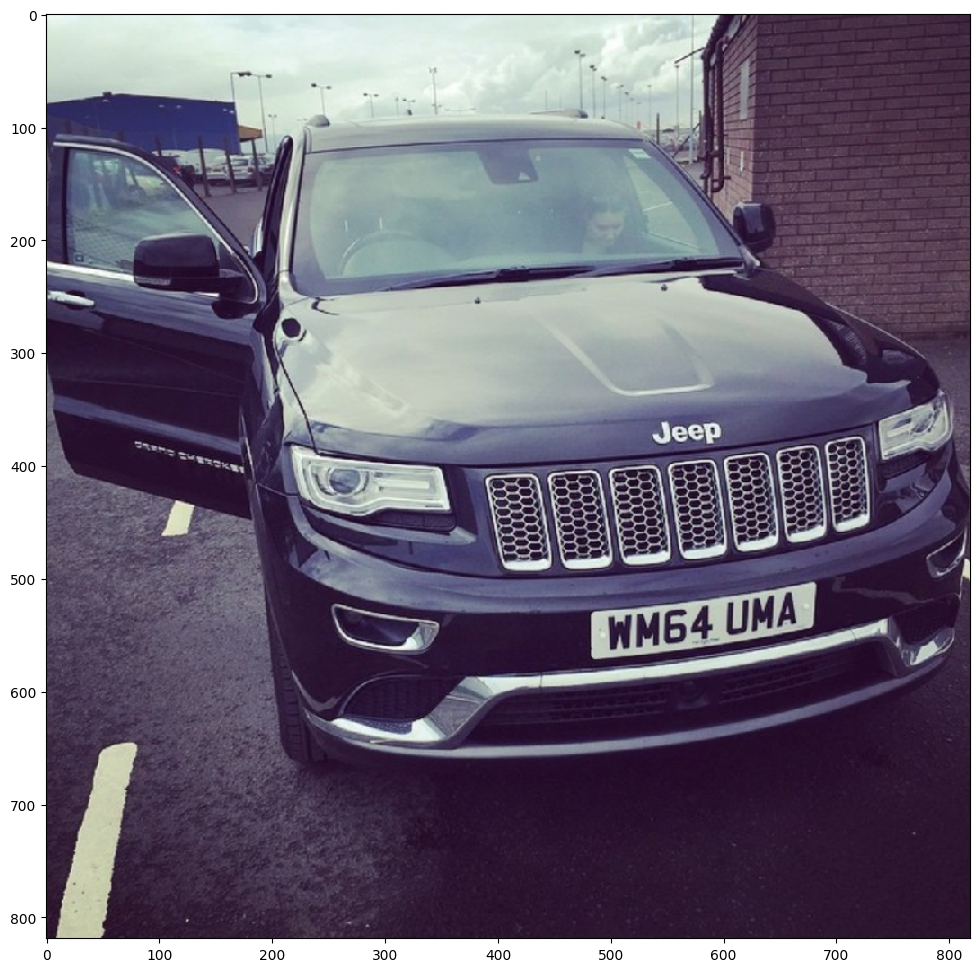

./data_root/Dataset/validation/Vehicle registration plate/2fe1f00b77a110a0.jpg
{'instances': Instances(num_instances=2, image_height=683, image_width=1024, fields=[pred_boxes: Boxes(tensor([[401.4594, 325.4757, 612.4655, 393.6765],
        [415.5202, 349.1676, 490.5201, 385.6220]], device='cuda:0')), scores: tensor([0.9546, 0.6246], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


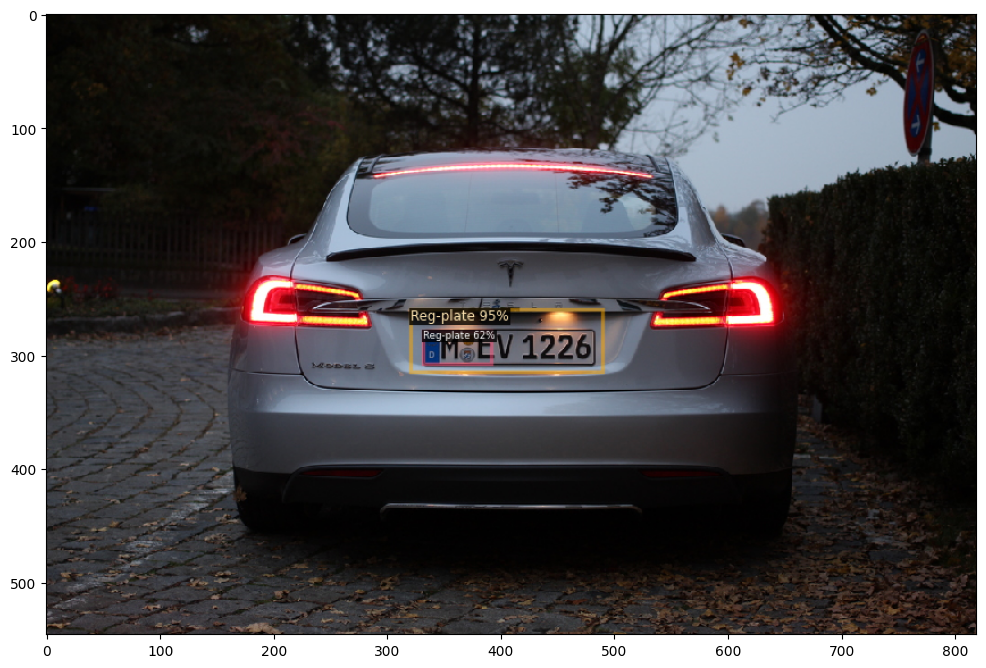

./data_root/Dataset/validation/Vehicle registration plate/35875c388efcddf0.jpg
{'instances': Instances(num_instances=1, image_height=768, image_width=1024, fields=[pred_boxes: Boxes(tensor([[451.4687, 379.7488, 755.5896, 533.0414]], device='cuda:0')), scores: tensor([0.9858], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


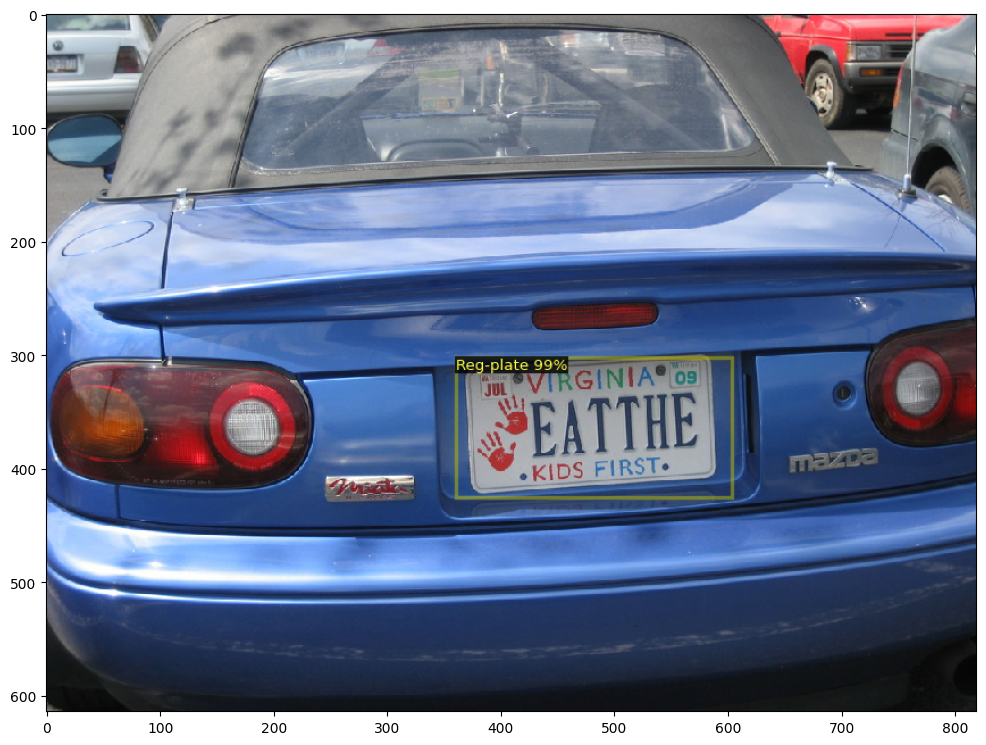

In [22]:
# let's have a look on prediction

for d in random.sample(test_data_dict, 3):
    print(d["file_name"])
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (12, 12))
    plt.imshow(v.get_image())
    plt.show()

#  <font style="color:green">4. COCO Detection Evaluation [25 Points]</font>

**You have to evaluate your detection model on COCO detection evaluation metric.**

For your reference here is the coco evaluation metric chart:


---

<img src="https://www.learnopencv.com/wp-content/uploads/2020/03/c3-w9-coco_metric.png">

---

#### <font style="color:red">The expected `AP` (primary challenge metric) is more than `0.5`.</font>

**The expected output should look similar to the following:**

```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.550
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.886
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.629
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.627
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.633
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.722
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.704
```



In [23]:
# create directory for evaluation
eval_dir = os.path.join(cfg.OUTPUT_DIR, 'coco_eval')
os.makedirs(eval_dir, exist_ok=True)

# create evaluator instance with coco evaluator
evaluator = COCOEvaluator(dataset_name=test_data_name,
                          tasks=cfg,
                          distributed=False,
                          output_dir=eval_dir)

# create validation data loader
val_loader = build_detection_test_loader(cfg, test_data_name)

# start validation
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/30 03:49:09 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[07/30 03:49:09 d2.evaluation.coco_evaluation]: Trying to convert 'vehicle_registration_plate_test' to COCO format ...
[07/30 03:49:09 d2.data.datasets.coco]: Converting annotations of dataset 'vehicle_registration_plate_test' to COCO format ...)
[07/30 03:49:09 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/30 03:49:09 d2.data.datasets.coco]: Conversion finished, #images: 10, #annotations: 12
[07/30 03:49:09 d2.data.datasets.coco]: Caching COCO format annotations at './data_root/outputs/coco_eval/vehicle_registration_plate_test_coco_format.json' ...
[07/30 03:49:09 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| Reg-plate  | 12           |
|            |              |
[07/30 03:49:09 d2.data.dataset_mapper]: [Datase

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[07/30 03:49:11 d2.evaluation.evaluator]: Total inference time: 0:00:00.603543 (0.120709 s / iter per device, on 1 devices)
[07/30 03:49:11 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.102446 s / iter per device, on 1 devices)
[07/30 03:49:11 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/30 03:49:11 d2.evaluation.coco_evaluation]: Saving results to ./data_root/outputs/coco_eval/coco_instances_results.json
[07/30 03:49:11 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[07/30 03:49:11 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[07/30 03:49:11 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[07/30 03:49:11 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[07/30 03:49:11 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Av

OrderedDict([('bbox',
              {'AP': 57.111831859877725,
               'AP50': 78.94881593422501,
               'AP75': 66.26948409126626,
               'APs': 3.927392739273928,
               'APm': 74.44884488448844,
               'APl': 62.32673267326733})])

# <font style="color:green">5. Run Inference on a Video [15 Points]</font>

#### [Download the Input Video](https://www.dropbox.com/s/g88o4dx18zpgn8k/projet3-input-video.mp4?dl=1)

**You have to run inference on a video.**

You can download the video from [here](https://www.dropbox.com/s/g88o4dx18zpgn8k/projet3-input-video.mp4?dl=1).

#### <font style="color:red">Upload the output video on youtube and share the link. Do not upload the video in the lab.</font>

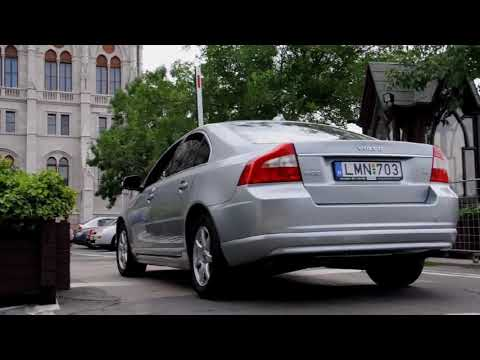

In [24]:
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("18HWHCevFdU", width=640, height=360)
display(video)

**Your output video should have a bounding box around the vehicle registration plate.**

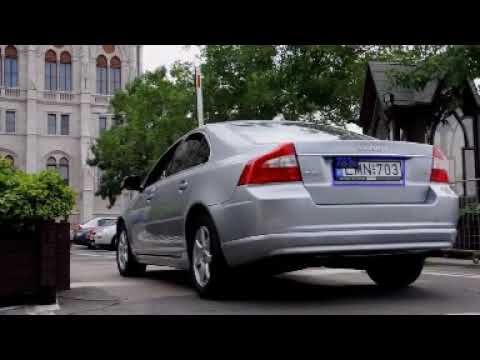

In [25]:
video = YouTubeVideo("5SgCuee7AMs", width=640, height=360)
display(video)

**You can use the following sample code to read and write a video.**

In [27]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
from google.colab import drive

# 1. Mount Google Drive (only need to run this once)
drive.mount('/content/drive')

# 2. Prepare your Drive output folder
drive_output_dir = '/content/drive/MyDrive/colab_outputs'
os.makedirs(drive_output_dir, exist_ok=True)

def video_read_write(video_path, predictor, metadata):
    video = cv2.VideoCapture(video_path)
    if not video.isOpened():
        print("Error opening video file")
        return

    width  = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps    = video.get(cv2.CAP_PROP_FPS)

    # 3. Build a safe output path in your Drive
    base = os.path.splitext(os.path.basename(video_path))[0]
    output_fname = os.path.join(drive_output_dir, f"{base}_output.mp4")
    print("Saving to Drive at:", output_fname)

    fourcc      = cv2.VideoWriter_fourcc(*'avc1')
    output_file = cv2.VideoWriter(output_fname, fourcc, fps, (width, height))

    frame_count = 0
    while True:
        ret, frame = video.read()
        if not ret:
            break

        # Inference + draw
        outputs = predictor(frame)
        vis     = Visualizer(frame[:, :, ::-1], metadata=metadata, scale=1.0, instance_mode=ColorMode.IMAGE)
        out     = vis.draw_instance_predictions(outputs["instances"].to("cpu"))

        # Write to Drive-mounted video
        output_frame = out.get_image()[:, :, ::-1]
        output_file.write(output_frame)

        frame_count += 1
        if frame_count % 50 == 0:
            print(f"Processed {frame_count} frames…")

    video.release()
    output_file.release()
    print("Finished writing video to Drive.")

# Example usage:
# cfg and predictor setup omitted for brevity
video_read_write("projet3-input-video.mp4", predictor, MetadataCatalog.get("vehicle_plate_test"))


Mounted at /content/drive
Error opening video file


In [ ]:
video_read_write(video_path, predictor, test_metadata)